In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/food41/food_test_c101_n1000_r64x64x3.h5
/kaggle/input/food41/food_c101_n10099_r32x32x3.h5
/kaggle/input/food41/food_c101_n1000_r384x384x3.h5
/kaggle/input/food41/food_test_c101_n1000_r128x128x3.h5
/kaggle/input/food41/food_test_c101_n1000_r32x32x3.h5
/kaggle/input/food41/food_test_c101_n1000_r32x32x1.h5
/kaggle/input/food41/food_test_c101_n1000_r128x128x1.h5
/kaggle/input/food41/food_c101_n10099_r64x64x1.h5
/kaggle/input/food41/food_c101_n10099_r64x64x3.h5
/kaggle/input/food41/food_test_c101_n1000_r64x64x1.h5
/kaggle/input/food41/food_c101_n10099_r32x32x1.h5
/kaggle/input/food41/meta/meta/test.txt
/kaggle/input/food41/meta/meta/train.json
/kaggle/input/food41/meta/meta/labels.txt
/kaggle/input/food41/meta/meta/test.json
/kaggle/input/food41/meta/meta/train.txt
/kaggle/input/food41/meta/meta/classes.txt
/kaggle/input/food41/images/macarons/2428554.jpg
/kaggle/input/food41/images/macarons/3842133.jpg
/kaggle/input/food41/images/macarons/1963752.jpg
/kaggle/input/food41/imag

In [2]:
!ls /kaggle/input/food41/images/

apple_pie	    eggs_benedict	     onion_rings
baby_back_ribs	    escargots		     oysters
baklava		    falafel		     pad_thai
beef_carpaccio	    filet_mignon	     paella
beef_tartare	    fish_and_chips	     pancakes
beet_salad	    foie_gras		     panna_cotta
beignets	    french_fries	     peking_duck
bibimbap	    french_onion_soup	     pho
bread_pudding	    french_toast	     pizza
breakfast_burrito   fried_calamari	     pork_chop
bruschetta	    fried_rice		     poutine
caesar_salad	    frozen_yogurt	     prime_rib
cannoli		    garlic_bread	     pulled_pork_sandwich
caprese_salad	    gnocchi		     ramen
carrot_cake	    greek_salad		     ravioli
ceviche		    grilled_cheese_sandwich  red_velvet_cake
cheese_plate	    grilled_salmon	     risotto
cheesecake	    guacamole		     samosa
chicken_curry	    gyoza		     sashimi
chicken_quesadilla  hamburger		     scallops
chicken_wings	    hot_and_sour_soup	     seaweed_salad
chocolate_cake	    hot_dog		     shrimp_and_grits
chocolate_mousse    huevo

In [3]:
from tqdm.notebook import tqdm
import random
import shutil
import os
import json

In [7]:
os.listdir("/kaggle/input/food41/images/")

['macarons',
 'french_toast',
 'lobster_bisque',
 'prime_rib',
 'pork_chop',
 'guacamole',
 'baby_back_ribs',
 'mussels',
 'beef_carpaccio',
 'poutine',
 'hot_and_sour_soup',
 'seaweed_salad',
 'foie_gras',
 'dumplings',
 'peking_duck',
 'takoyaki',
 'bibimbap',
 'falafel',
 'pulled_pork_sandwich',
 'lobster_roll_sandwich',
 'carrot_cake',
 'beet_salad',
 'panna_cotta',
 'donuts',
 'red_velvet_cake',
 'grilled_cheese_sandwich',
 'cannoli',
 'spring_rolls',
 'shrimp_and_grits',
 'clam_chowder',
 'omelette',
 'fried_calamari',
 'caprese_salad',
 'oysters',
 'scallops',
 'ramen',
 'grilled_salmon',
 'croque_madame',
 'filet_mignon',
 'hamburger',
 'spaghetti_carbonara',
 'miso_soup',
 'bread_pudding',
 'lasagna',
 'crab_cakes',
 'cheesecake',
 'spaghetti_bolognese',
 'cup_cakes',
 'creme_brulee',
 'waffles',
 'fish_and_chips',
 'paella',
 'macaroni_and_cheese',
 'chocolate_mousse',
 'ravioli',
 'chicken_curry',
 'caesar_salad',
 'nachos',
 'tiramisu',
 'frozen_yogurt',
 'ice_cream',
 'ris

In [8]:
os.listdir("/kaggle/input/food41/images/" + 'macarons')

['2428554.jpg',
 '3842133.jpg',
 '1963752.jpg',
 '1075.jpg',
 '2094416.jpg',
 '397954.jpg',
 '124381.jpg',
 '407716.jpg',
 '2844220.jpg',
 '1736833.jpg',
 '1573041.jpg',
 '2128858.jpg',
 '884964.jpg',
 '397941.jpg',
 '397948.jpg',
 '113029.jpg',
 '852762.jpg',
 '1849077.jpg',
 '2566480.jpg',
 '3191653.jpg',
 '3642322.jpg',
 '411182.jpg',
 '773688.jpg',
 '3632637.jpg',
 '2505199.jpg',
 '1878394.jpg',
 '2932129.jpg',
 '471095.jpg',
 '2120033.jpg',
 '2813919.jpg',
 '910896.jpg',
 '2539460.jpg',
 '2309778.jpg',
 '1569300.jpg',
 '1759631.jpg',
 '3658494.jpg',
 '1010087.jpg',
 '989810.jpg',
 '2616376.jpg',
 '3864608.jpg',
 '633941.jpg',
 '1962503.jpg',
 '3917914.jpg',
 '2799017.jpg',
 '294614.jpg',
 '2059656.jpg',
 '1876301.jpg',
 '1485562.jpg',
 '1373808.jpg',
 '2617154.jpg',
 '2432777.jpg',
 '1288619.jpg',
 '845188.jpg',
 '3253580.jpg',
 '1447451.jpg',
 '2467066.jpg',
 '2107351.jpg',
 '356293.jpg',
 '3503443.jpg',
 '2546580.jpg',
 '3443712.jpg',
 '980106.jpg',
 '669234.jpg',
 '570324.jpg',

In [4]:
def get_labels(label_path):
    with open(label_path) as f:
        return json.load(f)

train_labels = get_labels(r"/kaggle/input/food41/meta/meta/train.json")
test_labels = get_labels(r"/kaggle/input/food41/meta/meta/test.json")

In [5]:
print(len(train_labels["churros"]))
print(len(test_labels["churros"]))

750
250


In [6]:
train_labels["churros"][0]

'churros/1004234'

## Creating target class folders and moving images there

In [9]:
def copy_images(parent_folder, new_subset, dataset, target_labels):
    # Getting appropriate labels
    print(f"\nUsing {dataset} labels...")
    labels = get_labels("/kaggle/input/food41/meta/meta/" + dataset + ".json")
    
    for i in tqdm(target_labels):
        os.makedirs("/kaggle/working"+"/"+new_subset+"/"+dataset+"/"+i+"/", exist_ok=True)
        
        # Go through labels and get appropriate classes
        images_moved = []
        for j in labels[i]:
            og_path = parent_folder+"/food41/images/"+j+".jpg"
            new_path = "/kaggle/working"+"/"+new_subset+"/"+dataset+"/"+j+".jpg"
            shutil.copy2(og_path, new_path)
            images_moved.append(new_path)
        print(f"Copied {len(images_moved)} images from {dataset} dataset {i} class...")

## Creating function to get random sample of images

In [10]:
def get_percent_images(target_dir, new_dir, sample_amount=0.1, random_state=42):
    random.seed(random_state)
    
    images = [{dir_name: os.listdir(target_dir + dir_name)} for dir_name in os.listdir(target_dir)]
    
    for i in images:
        for k, v in i.items():
            # How many images to sample?
            sample_no = round(int(len(v)*sample_amount))
            print(f"There are {len(v)} total images in '{target_dir + k}' so we're going to copy {sample_no} to the new directory.")
            print(f"Getting {sample_no} random images for {k}...")
            random_images = random.sample(v, sample_no)
            
            # Make new dir for each key
            new_target_dir = new_dir + k
            print(f"Making dir:{new_target_dir}")
            os.makedirs(new_target_dir, exist_ok=True)
            
            # Keep track of images moved
            images_moved = []
            
            # Create file path for original images and new file target
            print(f"Copying images form: {target_dir}\n\t\t to: {new_target_dir}/\n")
            for file_name in tqdm(random_images):
                og_path = target_dir + k + "/" + file_name
                new_path = new_target_dir+"/"+file_name
                
                shutil.copy2(og_path, new_path)
                images_moved.append(new_path)
            
            assert len(os.listdir(new_target_dir)) == sample_no
            assert len(images_moved) == sample_no
                

## Making binary data (pizza and steak)

Two classes: steak and pizza.

In [11]:
parent_folder = "/kaggle/input"
target_labels = ["steak", "pizza"]
new_subset = "pizza_steak"
datasets = ["train", "test"]

for i in datasets:
    copy_images(parent_folder = parent_folder,
               new_subset=new_subset,
               dataset=i,
               target_labels=target_labels)


Using train labels...


  0%|          | 0/2 [00:00<?, ?it/s]

Copied 750 images from train dataset steak class...
Copied 750 images from train dataset pizza class...

Using test labels...


  0%|          | 0/2 [00:00<?, ?it/s]

Copied 250 images from test dataset steak class...
Copied 250 images from test dataset pizza class...


In [65]:
# So we created 750 for training and 250 for testing, let's check
print("Number of images in training set:", len(os.listdir("/kaggle/working/pizza_steak/train/steak")))
print("Number of images in testing set:", len(os.listdir("/kaggle/working/pizza_steak/test/steak")))

Number of images in training set: 750
Number of images in testing set: 250


In [66]:
train_files = set(os.listdir("/kaggle/working/pizza_steak/train/steak"))
test_files = set(os.listdir("/kaggle/working/pizza_steak/test/steak"))

assert len(train_files.intersection(test_files)) == 0

In [14]:
train_files = set(os.listdir("/kaggle/working/pizza_steak/train/pizza"))
test_files = set(os.listdir("/kaggle/working/pizza_steak/test/pizza"))

assert len(train_files.intersection(test_files)) == 0

## Make 10% binary class dataset

In [15]:
!ls /kaggle/working/pizza_steak

test  train


In [16]:
get_percent_images(target_dir="/kaggle/working/pizza_steak/train/",
                  new_dir="/kaggle/working/pizza_steak_10_percent/train",
                  sample_amount=0.1,
                  random_state=42)

There are 750 total images in '/kaggle/working/pizza_steak/train/pizza' so we're going to copy 75 to the new directory.
Getting 75 random images for pizza...
Making dir:/kaggle/working/pizza_steak_10_percent/trainpizza
Copying images form: /kaggle/working/pizza_steak/train/
		 to: /kaggle/working/pizza_steak_10_percent/trainpizza/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/pizza_steak/train/steak' so we're going to copy 75 to the new directory.
Getting 75 random images for steak...
Making dir:/kaggle/working/pizza_steak_10_percent/trainsteak
Copying images form: /kaggle/working/pizza_steak/train/
		 to: /kaggle/working/pizza_steak_10_percent/trainsteak/



  0%|          | 0/75 [00:00<?, ?it/s]

In [17]:
get_percent_images(target_dir="/kaggle/working/pizza_steak/train/",
                  new_dir="/kaggle/working/pizza_steak_1_percent/train",
                  sample_amount=0.01,
                  random_state=42)

There are 750 total images in '/kaggle/working/pizza_steak/train/pizza' so we're going to copy 7 to the new directory.
Getting 7 random images for pizza...
Making dir:/kaggle/working/pizza_steak_1_percent/trainpizza
Copying images form: /kaggle/working/pizza_steak/train/
		 to: /kaggle/working/pizza_steak_1_percent/trainpizza/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/pizza_steak/train/steak' so we're going to copy 7 to the new directory.
Getting 7 random images for steak...
Making dir:/kaggle/working/pizza_steak_1_percent/trainsteak
Copying images form: /kaggle/working/pizza_steak/train/
		 to: /kaggle/working/pizza_steak_1_percent/trainsteak/



  0%|          | 0/7 [00:00<?, ?it/s]

In [18]:
binary_test = "/kaggle/working/pizza_steak/test/"
shutil.copytree(binary_test, "/kaggle/working/pizza_10_steak/test/")
shutil.copytree(binary_test, "/kaggle/working/pizza_1_steak/test/")

'/kaggle/working/pizza_1_steak/test/'

## Visualizing Images

In [19]:
import sys
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

/kaggle/input/food41/images/chicken_curry/2000064.jpg


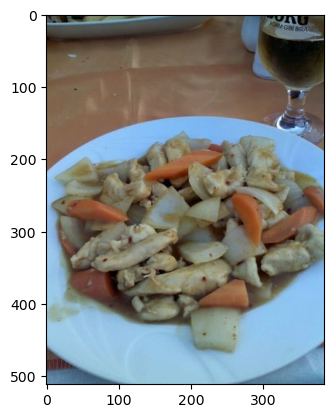

In [20]:
target_dir = "/kaggle/input/food41/images/"
target_class = "chicken_curry"
target_path = target_dir+target_class
file_names = os.listdir(target_path)
target_img = target_path + "/" + random.sample(file_names, 1)[0]
print(target_img)

img = mpimg.imread(target_img)
plt.imshow(img);

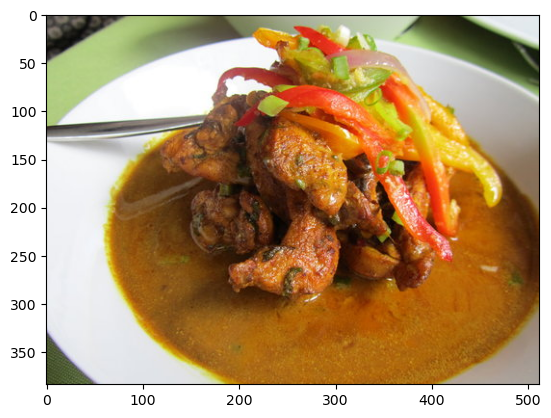

In [21]:
img = mpimg.imread("/kaggle/input/food41/images/chicken_curry/828808.jpg")
plt.imshow(img)

In [22]:
def view_three_images(target_dir, target_class):
    target_path = target_dir + target_class
    file_name = os.listdir(target_path)
    target_images = random.sample(file_name, 3)
    
#     plt.figure(figsize=(15, 6))
    for i, img in enumerate(target_images):
        img_path = target_path+"/"+img
        plt.subplot(2, 2, i+1)
        plt.imshow(mpimg.imread(img_path))
        plt.title(target_class)
        plt.axis("off")

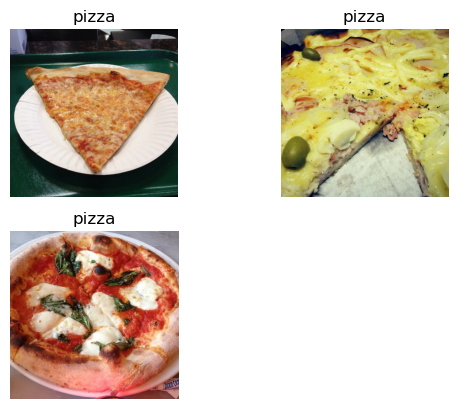

In [23]:
view_three_images(target_dir="/kaggle/input/food41/images/",
                 target_class="pizza")

## Making 10 class dataset

In [24]:
!ls /kaggle/input/food41/meta/meta

classes.txt  labels.txt  test.json  test.txt  train.json  train.txt


In [25]:
classes = []
i = 1
with open("/kaggle/input/food41/meta/meta/classes.txt") as f:
    for line in f.readlines():
        if i < 3:
            print(line)
            i += 1
        classes.append(line.split("\n")[0])

apple_pie

baby_back_ribs



In [26]:
print(classes)

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_sou

In [27]:
ten_classes = ["pizza", "steak", "sushi", "ramen", "chicken_wings",
               "chicken_curry", "hamburger", "fried_rice", "grilled_salmon", 
               "ice_cream"]
len(ten_classes)

10

In [28]:
parent_folder = "/kaggle/input"
new_subset = "10_food_classes"
datasets = ["train", "test"]

# Copy training/test images
for i in datasets:
    copy_images(parent_folder=parent_folder,
                new_subset=new_subset,
                dataset=i,
                target_labels=ten_classes)


Using train labels...


  0%|          | 0/10 [00:00<?, ?it/s]

Copied 750 images from train dataset pizza class...
Copied 750 images from train dataset steak class...
Copied 750 images from train dataset sushi class...
Copied 750 images from train dataset ramen class...
Copied 750 images from train dataset chicken_wings class...
Copied 750 images from train dataset chicken_curry class...
Copied 750 images from train dataset hamburger class...
Copied 750 images from train dataset fried_rice class...
Copied 750 images from train dataset grilled_salmon class...
Copied 750 images from train dataset ice_cream class...

Using test labels...


  0%|          | 0/10 [00:00<?, ?it/s]

Copied 250 images from test dataset pizza class...
Copied 250 images from test dataset steak class...
Copied 250 images from test dataset sushi class...
Copied 250 images from test dataset ramen class...
Copied 250 images from test dataset chicken_wings class...
Copied 250 images from test dataset chicken_curry class...
Copied 250 images from test dataset hamburger class...
Copied 250 images from test dataset fried_rice class...
Copied 250 images from test dataset grilled_salmon class...
Copied 250 images from test dataset ice_cream class...


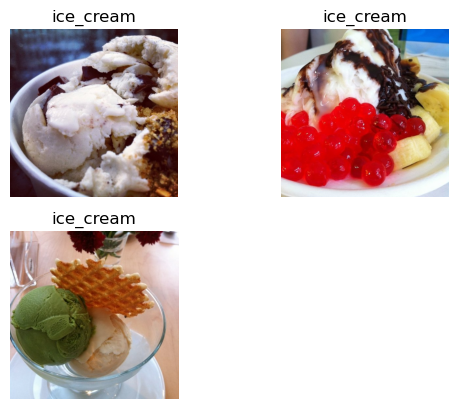

In [29]:
view_three_images(target_dir="/kaggle/input/food41/images/", 
                  target_class="ice_cream")

In [30]:
get_percent_images(target_dir="/kaggle/working/10_food_classes/train/",
                   new_dir="/kaggle/working/10_food_classes_10_percent/train/",
                   sample_amount=0.1, # 1%
                   random_state=42)

There are 750 total images in '/kaggle/working/10_food_classes/train/ramen' so we're going to copy 75 to the new directory.
Getting 75 random images for ramen...
Making dir:/kaggle/working/10_food_classes_10_percent/train/ramen
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/ramen/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/ice_cream' so we're going to copy 75 to the new directory.
Getting 75 random images for ice_cream...
Making dir:/kaggle/working/10_food_classes_10_percent/train/ice_cream
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/ice_cream/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/sushi' so we're going to copy 75 to the new directory.
Getting 75 random images for sushi...
Making dir:/kaggle/working/10_food_classes_10_percent/train/sushi
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/sushi/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/chicken_curry' so we're going to copy 75 to the new directory.
Getting 75 random images for chicken_curry...
Making dir:/kaggle/working/10_food_classes_10_percent/train/chicken_curry
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/chicken_curry/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/pizza' so we're going to copy 75 to the new directory.
Getting 75 random images for pizza...
Making dir:/kaggle/working/10_food_classes_10_percent/train/pizza
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/pizza/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/steak' so we're going to copy 75 to the new directory.
Getting 75 random images for steak...
Making dir:/kaggle/working/10_food_classes_10_percent/train/steak
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/steak/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/grilled_salmon' so we're going to copy 75 to the new directory.
Getting 75 random images for grilled_salmon...
Making dir:/kaggle/working/10_food_classes_10_percent/train/grilled_salmon
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/grilled_salmon/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/hamburger' so we're going to copy 75 to the new directory.
Getting 75 random images for hamburger...
Making dir:/kaggle/working/10_food_classes_10_percent/train/hamburger
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/hamburger/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/fried_rice' so we're going to copy 75 to the new directory.
Getting 75 random images for fried_rice...
Making dir:/kaggle/working/10_food_classes_10_percent/train/fried_rice
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/fried_rice/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/chicken_wings' so we're going to copy 75 to the new directory.
Getting 75 random images for chicken_wings...
Making dir:/kaggle/working/10_food_classes_10_percent/train/chicken_wings
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_10_percent/train/chicken_wings/



  0%|          | 0/75 [00:00<?, ?it/s]

In [31]:
get_percent_images(target_dir="/kaggle/working/10_food_classes/train/",
                   new_dir="/kaggle/working/10_food_classes_1_percent/train/",
                   sample_amount=0.01, # 1%
                   random_state=42)

There are 750 total images in '/kaggle/working/10_food_classes/train/ramen' so we're going to copy 7 to the new directory.
Getting 7 random images for ramen...
Making dir:/kaggle/working/10_food_classes_1_percent/train/ramen
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/ramen/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/ice_cream' so we're going to copy 7 to the new directory.
Getting 7 random images for ice_cream...
Making dir:/kaggle/working/10_food_classes_1_percent/train/ice_cream
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/ice_cream/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/sushi' so we're going to copy 7 to the new directory.
Getting 7 random images for sushi...
Making dir:/kaggle/working/10_food_classes_1_percent/train/sushi
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/sushi/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/chicken_curry' so we're going to copy 7 to the new directory.
Getting 7 random images for chicken_curry...
Making dir:/kaggle/working/10_food_classes_1_percent/train/chicken_curry
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/chicken_curry/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/pizza' so we're going to copy 7 to the new directory.
Getting 7 random images for pizza...
Making dir:/kaggle/working/10_food_classes_1_percent/train/pizza
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/pizza/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/steak' so we're going to copy 7 to the new directory.
Getting 7 random images for steak...
Making dir:/kaggle/working/10_food_classes_1_percent/train/steak
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/steak/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/grilled_salmon' so we're going to copy 7 to the new directory.
Getting 7 random images for grilled_salmon...
Making dir:/kaggle/working/10_food_classes_1_percent/train/grilled_salmon
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/grilled_salmon/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/hamburger' so we're going to copy 7 to the new directory.
Getting 7 random images for hamburger...
Making dir:/kaggle/working/10_food_classes_1_percent/train/hamburger
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/hamburger/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/fried_rice' so we're going to copy 7 to the new directory.
Getting 7 random images for fried_rice...
Making dir:/kaggle/working/10_food_classes_1_percent/train/fried_rice
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/fried_rice/



  0%|          | 0/7 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/10_food_classes/train/chicken_wings' so we're going to copy 7 to the new directory.
Getting 7 random images for chicken_wings...
Making dir:/kaggle/working/10_food_classes_1_percent/train/chicken_wings
Copying images form: /kaggle/working/10_food_classes/train/
		 to: /kaggle/working/10_food_classes_1_percent/train/chicken_wings/



  0%|          | 0/7 [00:00<?, ?it/s]

In [32]:
ten_percent_test = "/kaggle/working/10_food_classes/test/"
shutil.copytree(ten_percent_test, "/kaggle/working/10_food_classes_10_percent/test/")
shutil.copytree(ten_percent_test, "/kaggle/working/10_food_classes_1_percent/test/")

'/kaggle/working/10_food_classes_1_percent/test/'

## Spliting whole classes data set into train and test sets

In [33]:
classes

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [35]:
parent_folder = "/kaggle/input"
new_subset = "all_food_classes"
datasets = ["train", "test"]

# Copy training/test images
for i in datasets:
    copy_images(parent_folder=parent_folder,
                new_subset=new_subset,
                dataset=i,
                target_labels=classes)


Using train labels...


  0%|          | 0/101 [00:00<?, ?it/s]

Copied 750 images from train dataset apple_pie class...
Copied 750 images from train dataset baby_back_ribs class...
Copied 750 images from train dataset baklava class...
Copied 750 images from train dataset beef_carpaccio class...
Copied 750 images from train dataset beef_tartare class...
Copied 750 images from train dataset beet_salad class...
Copied 750 images from train dataset beignets class...
Copied 750 images from train dataset bibimbap class...
Copied 750 images from train dataset bread_pudding class...
Copied 750 images from train dataset breakfast_burrito class...
Copied 750 images from train dataset bruschetta class...
Copied 750 images from train dataset caesar_salad class...
Copied 750 images from train dataset cannoli class...
Copied 750 images from train dataset caprese_salad class...
Copied 750 images from train dataset carrot_cake class...
Copied 750 images from train dataset ceviche class...
Copied 750 images from train dataset cheesecake class...
Copied 750 images f

  0%|          | 0/101 [00:00<?, ?it/s]

Copied 250 images from test dataset apple_pie class...
Copied 250 images from test dataset baby_back_ribs class...
Copied 250 images from test dataset baklava class...
Copied 250 images from test dataset beef_carpaccio class...
Copied 250 images from test dataset beef_tartare class...
Copied 250 images from test dataset beet_salad class...
Copied 250 images from test dataset beignets class...
Copied 250 images from test dataset bibimbap class...
Copied 250 images from test dataset bread_pudding class...
Copied 250 images from test dataset breakfast_burrito class...
Copied 250 images from test dataset bruschetta class...
Copied 250 images from test dataset caesar_salad class...
Copied 250 images from test dataset cannoli class...
Copied 250 images from test dataset caprese_salad class...
Copied 250 images from test dataset carrot_cake class...
Copied 250 images from test dataset ceviche class...
Copied 250 images from test dataset cheesecake class...
Copied 250 images from test dataset 

In [36]:
get_percent_images(target_dir="/kaggle/working/all_food_classes/train/",
                   new_dir="/kaggle/working/all_food_classes_10_percent/train/",
                   sample_amount=0.1, # 10%
                   random_state=42)

There are 750 total images in '/kaggle/working/all_food_classes/train/creme_brulee' so we're going to copy 75 to the new directory.
Getting 75 random images for creme_brulee...
Making dir:/kaggle/working/all_food_classes_10_percent/train/creme_brulee
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/creme_brulee/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/lobster_bisque' so we're going to copy 75 to the new directory.
Getting 75 random images for lobster_bisque...
Making dir:/kaggle/working/all_food_classes_10_percent/train/lobster_bisque
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/lobster_bisque/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/hummus' so we're going to copy 75 to the new directory.
Getting 75 random images for hummus...
Making dir:/kaggle/working/all_food_classes_10_percent/train/hummus
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/hummus/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/paella' so we're going to copy 75 to the new directory.
Getting 75 random images for paella...
Making dir:/kaggle/working/all_food_classes_10_percent/train/paella
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/paella/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/french_onion_soup' so we're going to copy 75 to the new directory.
Getting 75 random images for french_onion_soup...
Making dir:/kaggle/working/all_food_classes_10_percent/train/french_onion_soup
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/french_onion_soup/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/french_toast' so we're going to copy 75 to the new directory.
Getting 75 random images for french_toast...
Making dir:/kaggle/working/all_food_classes_10_percent/train/french_toast
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/french_toast/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/garlic_bread' so we're going to copy 75 to the new directory.
Getting 75 random images for garlic_bread...
Making dir:/kaggle/working/all_food_classes_10_percent/train/garlic_bread
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/garlic_bread/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/greek_salad' so we're going to copy 75 to the new directory.
Getting 75 random images for greek_salad...
Making dir:/kaggle/working/all_food_classes_10_percent/train/greek_salad
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/greek_salad/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/pho' so we're going to copy 75 to the new directory.
Getting 75 random images for pho...
Making dir:/kaggle/working/all_food_classes_10_percent/train/pho
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/pho/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/chicken_quesadilla' so we're going to copy 75 to the new directory.
Getting 75 random images for chicken_quesadilla...
Making dir:/kaggle/working/all_food_classes_10_percent/train/chicken_quesadilla
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/chicken_quesadilla/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/strawberry_shortcake' so we're going to copy 75 to the new directory.
Getting 75 random images for strawberry_shortcake...
Making dir:/kaggle/working/all_food_classes_10_percent/train/strawberry_shortcake
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/strawberry_shortcake/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/ramen' so we're going to copy 75 to the new directory.
Getting 75 random images for ramen...
Making dir:/kaggle/working/all_food_classes_10_percent/train/ramen
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/ramen/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/spaghetti_carbonara' so we're going to copy 75 to the new directory.
Getting 75 random images for spaghetti_carbonara...
Making dir:/kaggle/working/all_food_classes_10_percent/train/spaghetti_carbonara
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/spaghetti_carbonara/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/ice_cream' so we're going to copy 75 to the new directory.
Getting 75 random images for ice_cream...
Making dir:/kaggle/working/all_food_classes_10_percent/train/ice_cream
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/ice_cream/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/club_sandwich' so we're going to copy 75 to the new directory.
Getting 75 random images for club_sandwich...
Making dir:/kaggle/working/all_food_classes_10_percent/train/club_sandwich
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/club_sandwich/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/gyoza' so we're going to copy 75 to the new directory.
Getting 75 random images for gyoza...
Making dir:/kaggle/working/all_food_classes_10_percent/train/gyoza
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/gyoza/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/hot_and_sour_soup' so we're going to copy 75 to the new directory.
Getting 75 random images for hot_and_sour_soup...
Making dir:/kaggle/working/all_food_classes_10_percent/train/hot_and_sour_soup
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/hot_and_sour_soup/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/deviled_eggs' so we're going to copy 75 to the new directory.
Getting 75 random images for deviled_eggs...
Making dir:/kaggle/working/all_food_classes_10_percent/train/deviled_eggs
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/deviled_eggs/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/filet_mignon' so we're going to copy 75 to the new directory.
Getting 75 random images for filet_mignon...
Making dir:/kaggle/working/all_food_classes_10_percent/train/filet_mignon
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/filet_mignon/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/cheesecake' so we're going to copy 75 to the new directory.
Getting 75 random images for cheesecake...
Making dir:/kaggle/working/all_food_classes_10_percent/train/cheesecake
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/cheesecake/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/foie_gras' so we're going to copy 75 to the new directory.
Getting 75 random images for foie_gras...
Making dir:/kaggle/working/all_food_classes_10_percent/train/foie_gras
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/foie_gras/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/miso_soup' so we're going to copy 75 to the new directory.
Getting 75 random images for miso_soup...
Making dir:/kaggle/working/all_food_classes_10_percent/train/miso_soup
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/miso_soup/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/sushi' so we're going to copy 75 to the new directory.
Getting 75 random images for sushi...
Making dir:/kaggle/working/all_food_classes_10_percent/train/sushi
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/sushi/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/apple_pie' so we're going to copy 75 to the new directory.
Getting 75 random images for apple_pie...
Making dir:/kaggle/working/all_food_classes_10_percent/train/apple_pie
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/apple_pie/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/chicken_curry' so we're going to copy 75 to the new directory.
Getting 75 random images for chicken_curry...
Making dir:/kaggle/working/all_food_classes_10_percent/train/chicken_curry
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/chicken_curry/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/samosa' so we're going to copy 75 to the new directory.
Getting 75 random images for samosa...
Making dir:/kaggle/working/all_food_classes_10_percent/train/samosa
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/samosa/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/beef_tartare' so we're going to copy 75 to the new directory.
Getting 75 random images for beef_tartare...
Making dir:/kaggle/working/all_food_classes_10_percent/train/beef_tartare
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/beef_tartare/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/spaghetti_bolognese' so we're going to copy 75 to the new directory.
Getting 75 random images for spaghetti_bolognese...
Making dir:/kaggle/working/all_food_classes_10_percent/train/spaghetti_bolognese
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/spaghetti_bolognese/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/pizza' so we're going to copy 75 to the new directory.
Getting 75 random images for pizza...
Making dir:/kaggle/working/all_food_classes_10_percent/train/pizza
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/pizza/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/eggs_benedict' so we're going to copy 75 to the new directory.
Getting 75 random images for eggs_benedict...
Making dir:/kaggle/working/all_food_classes_10_percent/train/eggs_benedict
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/eggs_benedict/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/steak' so we're going to copy 75 to the new directory.
Getting 75 random images for steak...
Making dir:/kaggle/working/all_food_classes_10_percent/train/steak
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/steak/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/beef_carpaccio' so we're going to copy 75 to the new directory.
Getting 75 random images for beef_carpaccio...
Making dir:/kaggle/working/all_food_classes_10_percent/train/beef_carpaccio
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/beef_carpaccio/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/shrimp_and_grits' so we're going to copy 75 to the new directory.
Getting 75 random images for shrimp_and_grits...
Making dir:/kaggle/working/all_food_classes_10_percent/train/shrimp_and_grits
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/shrimp_and_grits/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/dumplings' so we're going to copy 75 to the new directory.
Getting 75 random images for dumplings...
Making dir:/kaggle/working/all_food_classes_10_percent/train/dumplings
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/dumplings/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/bread_pudding' so we're going to copy 75 to the new directory.
Getting 75 random images for bread_pudding...
Making dir:/kaggle/working/all_food_classes_10_percent/train/bread_pudding
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/bread_pudding/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/breakfast_burrito' so we're going to copy 75 to the new directory.
Getting 75 random images for breakfast_burrito...
Making dir:/kaggle/working/all_food_classes_10_percent/train/breakfast_burrito
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/breakfast_burrito/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/oysters' so we're going to copy 75 to the new directory.
Getting 75 random images for oysters...
Making dir:/kaggle/working/all_food_classes_10_percent/train/oysters
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/oysters/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/grilled_salmon' so we're going to copy 75 to the new directory.
Getting 75 random images for grilled_salmon...
Making dir:/kaggle/working/all_food_classes_10_percent/train/grilled_salmon
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/grilled_salmon/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/grilled_cheese_sandwich' so we're going to copy 75 to the new directory.
Getting 75 random images for grilled_cheese_sandwich...
Making dir:/kaggle/working/all_food_classes_10_percent/train/grilled_cheese_sandwich
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/grilled_cheese_sandwich/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/hot_dog' so we're going to copy 75 to the new directory.
Getting 75 random images for hot_dog...
Making dir:/kaggle/working/all_food_classes_10_percent/train/hot_dog
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/hot_dog/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/cup_cakes' so we're going to copy 75 to the new directory.
Getting 75 random images for cup_cakes...
Making dir:/kaggle/working/all_food_classes_10_percent/train/cup_cakes
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/cup_cakes/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/frozen_yogurt' so we're going to copy 75 to the new directory.
Getting 75 random images for frozen_yogurt...
Making dir:/kaggle/working/all_food_classes_10_percent/train/frozen_yogurt
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/frozen_yogurt/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/prime_rib' so we're going to copy 75 to the new directory.
Getting 75 random images for prime_rib...
Making dir:/kaggle/working/all_food_classes_10_percent/train/prime_rib
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/prime_rib/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/onion_rings' so we're going to copy 75 to the new directory.
Getting 75 random images for onion_rings...
Making dir:/kaggle/working/all_food_classes_10_percent/train/onion_rings
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/onion_rings/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/guacamole' so we're going to copy 75 to the new directory.
Getting 75 random images for guacamole...
Making dir:/kaggle/working/all_food_classes_10_percent/train/guacamole
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/guacamole/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/tuna_tartare' so we're going to copy 75 to the new directory.
Getting 75 random images for tuna_tartare...
Making dir:/kaggle/working/all_food_classes_10_percent/train/tuna_tartare
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/tuna_tartare/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/ravioli' so we're going to copy 75 to the new directory.
Getting 75 random images for ravioli...
Making dir:/kaggle/working/all_food_classes_10_percent/train/ravioli
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/ravioli/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/nachos' so we're going to copy 75 to the new directory.
Getting 75 random images for nachos...
Making dir:/kaggle/working/all_food_classes_10_percent/train/nachos
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/nachos/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/gnocchi' so we're going to copy 75 to the new directory.
Getting 75 random images for gnocchi...
Making dir:/kaggle/working/all_food_classes_10_percent/train/gnocchi
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/gnocchi/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/chocolate_mousse' so we're going to copy 75 to the new directory.
Getting 75 random images for chocolate_mousse...
Making dir:/kaggle/working/all_food_classes_10_percent/train/chocolate_mousse
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/chocolate_mousse/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/baby_back_ribs' so we're going to copy 75 to the new directory.
Getting 75 random images for baby_back_ribs...
Making dir:/kaggle/working/all_food_classes_10_percent/train/baby_back_ribs
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/baby_back_ribs/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/beignets' so we're going to copy 75 to the new directory.
Getting 75 random images for beignets...
Making dir:/kaggle/working/all_food_classes_10_percent/train/beignets
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/beignets/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/panna_cotta' so we're going to copy 75 to the new directory.
Getting 75 random images for panna_cotta...
Making dir:/kaggle/working/all_food_classes_10_percent/train/panna_cotta
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/panna_cotta/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/scallops' so we're going to copy 75 to the new directory.
Getting 75 random images for scallops...
Making dir:/kaggle/working/all_food_classes_10_percent/train/scallops
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/scallops/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/mussels' so we're going to copy 75 to the new directory.
Getting 75 random images for mussels...
Making dir:/kaggle/working/all_food_classes_10_percent/train/mussels
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/mussels/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/peking_duck' so we're going to copy 75 to the new directory.
Getting 75 random images for peking_duck...
Making dir:/kaggle/working/all_food_classes_10_percent/train/peking_duck
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/peking_duck/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/french_fries' so we're going to copy 75 to the new directory.
Getting 75 random images for french_fries...
Making dir:/kaggle/working/all_food_classes_10_percent/train/french_fries
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/french_fries/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/caprese_salad' so we're going to copy 75 to the new directory.
Getting 75 random images for caprese_salad...
Making dir:/kaggle/working/all_food_classes_10_percent/train/caprese_salad
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/caprese_salad/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/falafel' so we're going to copy 75 to the new directory.
Getting 75 random images for falafel...
Making dir:/kaggle/working/all_food_classes_10_percent/train/falafel
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/falafel/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/pork_chop' so we're going to copy 75 to the new directory.
Getting 75 random images for pork_chop...
Making dir:/kaggle/working/all_food_classes_10_percent/train/pork_chop
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/pork_chop/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/tiramisu' so we're going to copy 75 to the new directory.
Getting 75 random images for tiramisu...
Making dir:/kaggle/working/all_food_classes_10_percent/train/tiramisu
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/tiramisu/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/hamburger' so we're going to copy 75 to the new directory.
Getting 75 random images for hamburger...
Making dir:/kaggle/working/all_food_classes_10_percent/train/hamburger
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/hamburger/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/fried_calamari' so we're going to copy 75 to the new directory.
Getting 75 random images for fried_calamari...
Making dir:/kaggle/working/all_food_classes_10_percent/train/fried_calamari
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/fried_calamari/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/croque_madame' so we're going to copy 75 to the new directory.
Getting 75 random images for croque_madame...
Making dir:/kaggle/working/all_food_classes_10_percent/train/croque_madame
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/croque_madame/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/risotto' so we're going to copy 75 to the new directory.
Getting 75 random images for risotto...
Making dir:/kaggle/working/all_food_classes_10_percent/train/risotto
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/risotto/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/cannoli' so we're going to copy 75 to the new directory.
Getting 75 random images for cannoli...
Making dir:/kaggle/working/all_food_classes_10_percent/train/cannoli
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/cannoli/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/escargots' so we're going to copy 75 to the new directory.
Getting 75 random images for escargots...
Making dir:/kaggle/working/all_food_classes_10_percent/train/escargots
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/escargots/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/cheese_plate' so we're going to copy 75 to the new directory.
Getting 75 random images for cheese_plate...
Making dir:/kaggle/working/all_food_classes_10_percent/train/cheese_plate
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/cheese_plate/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/donuts' so we're going to copy 75 to the new directory.
Getting 75 random images for donuts...
Making dir:/kaggle/working/all_food_classes_10_percent/train/donuts
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/donuts/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/spring_rolls' so we're going to copy 75 to the new directory.
Getting 75 random images for spring_rolls...
Making dir:/kaggle/working/all_food_classes_10_percent/train/spring_rolls
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/spring_rolls/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/caesar_salad' so we're going to copy 75 to the new directory.
Getting 75 random images for caesar_salad...
Making dir:/kaggle/working/all_food_classes_10_percent/train/caesar_salad
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/caesar_salad/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/pad_thai' so we're going to copy 75 to the new directory.
Getting 75 random images for pad_thai...
Making dir:/kaggle/working/all_food_classes_10_percent/train/pad_thai
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/pad_thai/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/sashimi' so we're going to copy 75 to the new directory.
Getting 75 random images for sashimi...
Making dir:/kaggle/working/all_food_classes_10_percent/train/sashimi
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/sashimi/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/omelette' so we're going to copy 75 to the new directory.
Getting 75 random images for omelette...
Making dir:/kaggle/working/all_food_classes_10_percent/train/omelette
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/omelette/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/edamame' so we're going to copy 75 to the new directory.
Getting 75 random images for edamame...
Making dir:/kaggle/working/all_food_classes_10_percent/train/edamame
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/edamame/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/waffles' so we're going to copy 75 to the new directory.
Getting 75 random images for waffles...
Making dir:/kaggle/working/all_food_classes_10_percent/train/waffles
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/waffles/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/red_velvet_cake' so we're going to copy 75 to the new directory.
Getting 75 random images for red_velvet_cake...
Making dir:/kaggle/working/all_food_classes_10_percent/train/red_velvet_cake
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/red_velvet_cake/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/bibimbap' so we're going to copy 75 to the new directory.
Getting 75 random images for bibimbap...
Making dir:/kaggle/working/all_food_classes_10_percent/train/bibimbap
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/bibimbap/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/bruschetta' so we're going to copy 75 to the new directory.
Getting 75 random images for bruschetta...
Making dir:/kaggle/working/all_food_classes_10_percent/train/bruschetta
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/bruschetta/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/macarons' so we're going to copy 75 to the new directory.
Getting 75 random images for macarons...
Making dir:/kaggle/working/all_food_classes_10_percent/train/macarons
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/macarons/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/pancakes' so we're going to copy 75 to the new directory.
Getting 75 random images for pancakes...
Making dir:/kaggle/working/all_food_classes_10_percent/train/pancakes
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/pancakes/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/chocolate_cake' so we're going to copy 75 to the new directory.
Getting 75 random images for chocolate_cake...
Making dir:/kaggle/working/all_food_classes_10_percent/train/chocolate_cake
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/chocolate_cake/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/lasagna' so we're going to copy 75 to the new directory.
Getting 75 random images for lasagna...
Making dir:/kaggle/working/all_food_classes_10_percent/train/lasagna
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/lasagna/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/crab_cakes' so we're going to copy 75 to the new directory.
Getting 75 random images for crab_cakes...
Making dir:/kaggle/working/all_food_classes_10_percent/train/crab_cakes
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/crab_cakes/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/churros' so we're going to copy 75 to the new directory.
Getting 75 random images for churros...
Making dir:/kaggle/working/all_food_classes_10_percent/train/churros
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/churros/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/tacos' so we're going to copy 75 to the new directory.
Getting 75 random images for tacos...
Making dir:/kaggle/working/all_food_classes_10_percent/train/tacos
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/tacos/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/clam_chowder' so we're going to copy 75 to the new directory.
Getting 75 random images for clam_chowder...
Making dir:/kaggle/working/all_food_classes_10_percent/train/clam_chowder
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/clam_chowder/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/ceviche' so we're going to copy 75 to the new directory.
Getting 75 random images for ceviche...
Making dir:/kaggle/working/all_food_classes_10_percent/train/ceviche
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/ceviche/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/lobster_roll_sandwich' so we're going to copy 75 to the new directory.
Getting 75 random images for lobster_roll_sandwich...
Making dir:/kaggle/working/all_food_classes_10_percent/train/lobster_roll_sandwich
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/lobster_roll_sandwich/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/huevos_rancheros' so we're going to copy 75 to the new directory.
Getting 75 random images for huevos_rancheros...
Making dir:/kaggle/working/all_food_classes_10_percent/train/huevos_rancheros
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/huevos_rancheros/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/fried_rice' so we're going to copy 75 to the new directory.
Getting 75 random images for fried_rice...
Making dir:/kaggle/working/all_food_classes_10_percent/train/fried_rice
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/fried_rice/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/poutine' so we're going to copy 75 to the new directory.
Getting 75 random images for poutine...
Making dir:/kaggle/working/all_food_classes_10_percent/train/poutine
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/poutine/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/fish_and_chips' so we're going to copy 75 to the new directory.
Getting 75 random images for fish_and_chips...
Making dir:/kaggle/working/all_food_classes_10_percent/train/fish_and_chips
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/fish_and_chips/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/baklava' so we're going to copy 75 to the new directory.
Getting 75 random images for baklava...
Making dir:/kaggle/working/all_food_classes_10_percent/train/baklava
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/baklava/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/macaroni_and_cheese' so we're going to copy 75 to the new directory.
Getting 75 random images for macaroni_and_cheese...
Making dir:/kaggle/working/all_food_classes_10_percent/train/macaroni_and_cheese
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/macaroni_and_cheese/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/takoyaki' so we're going to copy 75 to the new directory.
Getting 75 random images for takoyaki...
Making dir:/kaggle/working/all_food_classes_10_percent/train/takoyaki
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/takoyaki/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/chicken_wings' so we're going to copy 75 to the new directory.
Getting 75 random images for chicken_wings...
Making dir:/kaggle/working/all_food_classes_10_percent/train/chicken_wings
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/chicken_wings/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/carrot_cake' so we're going to copy 75 to the new directory.
Getting 75 random images for carrot_cake...
Making dir:/kaggle/working/all_food_classes_10_percent/train/carrot_cake
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/carrot_cake/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/seaweed_salad' so we're going to copy 75 to the new directory.
Getting 75 random images for seaweed_salad...
Making dir:/kaggle/working/all_food_classes_10_percent/train/seaweed_salad
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/seaweed_salad/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/pulled_pork_sandwich' so we're going to copy 75 to the new directory.
Getting 75 random images for pulled_pork_sandwich...
Making dir:/kaggle/working/all_food_classes_10_percent/train/pulled_pork_sandwich
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/pulled_pork_sandwich/



  0%|          | 0/75 [00:00<?, ?it/s]

There are 750 total images in '/kaggle/working/all_food_classes/train/beet_salad' so we're going to copy 75 to the new directory.
Getting 75 random images for beet_salad...
Making dir:/kaggle/working/all_food_classes_10_percent/train/beet_salad
Copying images form: /kaggle/working/all_food_classes/train/
		 to: /kaggle/working/all_food_classes_10_percent/train/beet_salad/



  0%|          | 0/75 [00:00<?, ?it/s]

In [37]:
ten_percent_test = "/kaggle/working/all_food_classes/test/"
shutil.copytree(ten_percent_test, "/kaggle/working/all_food_classes_10_percent/test/")

'/kaggle/working/all_food_classes_10_percent/test/'

## Inspecting the Data and Building CNN

In [38]:
!ls /kaggle/working/pizza_steak/train/

pizza  steak


In [39]:
!ls /kaggle/working/pizza_steak/train/steak/

1000205.jpg  1647351.jpg  2238681.jpg  2824680.jpg  3375959.jpg  417368.jpg
100135.jpg   1650002.jpg  2238802.jpg  2825100.jpg  3381560.jpg  4176.jpg
101312.jpg   165639.jpg   2254705.jpg  2826987.jpg  3382936.jpg  42125.jpg
1021458.jpg  1658186.jpg  225990.jpg   2832499.jpg  3386119.jpg  421476.jpg
1032846.jpg  1658443.jpg  2260231.jpg  2832960.jpg  3388717.jpg  421561.jpg
10380.jpg    165964.jpg   2268692.jpg  285045.jpg   3389138.jpg  438871.jpg
1049459.jpg  167069.jpg   2271133.jpg  285147.jpg   3393547.jpg  43924.jpg
1053665.jpg  1675632.jpg  227576.jpg   2855315.jpg  3393688.jpg  440188.jpg
1068516.jpg  1678108.jpg  2283057.jpg  2856066.jpg  3396589.jpg  442757.jpg
1068975.jpg  168006.jpg   2286639.jpg  2859933.jpg  339891.jpg	 443210.jpg
1081258.jpg  1682496.jpg  2287136.jpg  286219.jpg   3417789.jpg  444064.jpg
1090122.jpg  1684438.jpg  2291292.jpg  2862562.jpg  3425047.jpg  444709.jpg
1093966.jpg  168775.jpg   229323.jpg   2865730.jpg  3434983.jpg  447557.jpg
1098844.jpg  1697

In [40]:
print(len(os.listdir("/kaggle/working/pizza_steak/train/steak/")))

750


In [41]:
!ls /kaggle/working/pizza_steak/train/pizza

1008104.jpg  1638227.jpg  2235981.jpg  2774899.jpg  3464027.jpg  576236.jpg
1008144.jpg  1646974.jpg  2236914.jpg  2775763.jpg  3464858.jpg  5764.jpg
1008844.jpg  1649108.jpg  2241448.jpg  2778214.jpg  3473991.jpg  579691.jpg
1008941.jpg  1649276.jpg  2247711.jpg  277963.jpg   3475936.jpg  593400.jpg
1011404.jpg  1652943.jpg  2253670.jpg  2785084.jpg  3478964.jpg  59445.jpg
102037.jpg   1654444.jpg  2255361.jpg  2793535.jpg  3479875.jpg  596494.jpg
1026922.jpg  1660415.jpg  2274117.jpg  27963.jpg    3479936.jpg  598381.jpg
1029698.jpg  1663749.jpg  2279642.jpg  2800325.jpg  3484590.jpg  604977.jpg
1033251.jpg  1665654.jpg  2280345.jpg  2811032.jpg  3493457.jpg  608085.jpg
1035854.jpg  166823.jpg   2285269.jpg  282013.jpg   349946.jpg	 618021.jpg
1038357.jpg  1670471.jpg  2285942.jpg  2821034.jpg  350358.jpg	 61822.jpg
1040878.jpg  1671531.jpg  228778.jpg   2821048.jpg  3505182.jpg  618348.jpg
1044524.jpg  1678284.jpg  2291093.jpg  2827938.jpg  3512070.jpg  625687.jpg
1044789.jpg  16810

In [42]:
print(len(os.listdir("/kaggle/working/pizza_steak/train/pizza")))

750


In [43]:
import pathlib
import numpy as np
data_dir = pathlib.Path("/kaggle/working/pizza_steak/train")
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['pizza' 'steak']


In [67]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import random

def view_random_image(target_dir, target_class):
    target_folder = target_dir + target_class
    random_image = random.sample(os.listdir(target_folder), 1)
    
    img = mpimg.imread(target_folder + '/' + random_image[0])
    plt.imshow(img)
    plt.title(target_class)
    plt.axis("off")
    print(f"image shape: {img.shape}")
    return img

image shape: (307, 512, 3)


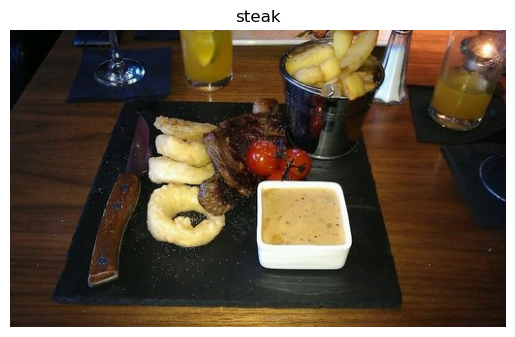

In [78]:
img = view_random_image(target_dir="/kaggle/working/pizza_steak/train/",
                       target_class="steak")

## Building CNN-model which is scale down of [VGG-16](https://arxiv.org/abs/1505.06798)

In [71]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the seed
tf.random.set_seed(42)
train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)

# Setup the train and test directories
train_dir = "/kaggle/working/pizza_steak/train/"
test_dir = "/kaggle/working/pizza_steak/test/"

# Importing data from directory and turning them into batches
train_data = train_datagen.flow_from_directory(train_dir,
                                              batch_size=32,
                                              target_size=(224, 224),
                                              class_mode="binary",
                                              seed=42)

valid_data = valid_datagen.flow_from_directory(test_dir,
                                              batch_size=32,
                                              target_size=(224,224),
                                              class_mode="binary",
                                              seed=42)

# Creating a CNN Model
model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu",
                           input_shape=(224, 224, 3)),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

# Complie the model
model_1.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/5
47/47 [==============================] - 69s 1s/step - loss: 0.5920 - accuracy: 0.6887 - val_loss: 0.4941 - val_accuracy: 0.7600
Epoch 2/5
47/47 [==============================] - 67s 1s/step - loss: 0.4801 - accuracy: 0.7753 - val_loss: 0.3696 - val_accuracy: 0.8520
Epoch 3/5
47/47 [==============================] - 67s 1s/step - loss: 0.3985 - accuracy: 0.8247 - val_loss: 0.3803 - val_accuracy: 0.8440
Epoch 4/5
47/47 [==============================] - 66s 1s/step - loss: 0.3896 - accuracy: 0.8333 - val_loss: 0.2978 - val_accuracy: 0.8860
Epoch 5/5
47/47 [==============================] - 66s 1s/step - loss: 0.3223 - accuracy: 0.8673 - val_loss: 0.2648 - val_accuracy: 0.9000


In [50]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

## Trying Basic Model

In [51]:
# Set seed
tf.random.set_seed(42)

model_2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224,224,3)),
    tf.keras.layers.Dense(4, activation="relu"),
    tf.keras.layers.Dense(4, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

model_2.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

history_2 = model_2.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data))

Epoch 1/5
47/47 [==============================] - 7s 131ms/step - loss: 0.7030 - accuracy: 0.4960 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/5
47/47 [==============================] - 7s 150ms/step - loss: 0.6933 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/5
47/47 [==============================] - 6s 120ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 4/5
47/47 [==============================] - 6s 134ms/step - loss: 0.6932 - accuracy: 0.4893 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 5/5
47/47 [==============================] - 7s 147ms/step - loss: 0.6932 - accuracy: 0.4800 - val_loss: 0.6931 - val_accuracy: 0.5000


In [52]:
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 150528)            0         
                                                                 
 dense_1 (Dense)             (None, 4)                 602116    
                                                                 
 dense_2 (Dense)             (None, 4)                 20        
                                                                 
 dense_3 (Dense)             (None, 1)                 5         
                                                                 
Total params: 602,141
Trainable params: 602,141
Non-trainable params: 0
_________________________________________________________________


In [53]:
tf.random.set_seed(42)

model_3 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224,224,3)),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

model_3.compile(loss="binary_crossentropy",
               optimizer=tf.keras.optimizers.Adam(),
               metrics=["accuracy"])

model_3.fit(train_data,
           epochs=5,
           steps_per_epoch=len(train_data),
           validation_data=valid_data,
           validation_steps=len(valid_data))

Epoch 1/5
47/47 [==============================] - 36s 731ms/step - loss: 4.1067 - accuracy: 0.5980 - val_loss: 2.1983 - val_accuracy: 0.5880
Epoch 2/5
47/47 [==============================] - 13s 259ms/step - loss: 0.9946 - accuracy: 0.6967 - val_loss: 0.8389 - val_accuracy: 0.6560
Epoch 3/5
47/47 [==============================] - 12s 250ms/step - loss: 0.6546 - accuracy: 0.7307 - val_loss: 0.5311 - val_accuracy: 0.7380
Epoch 4/5
47/47 [==============================] - 12s 258ms/step - loss: 0.6362 - accuracy: 0.7367 - val_loss: 0.4482 - val_accuracy: 0.7920
Epoch 5/5
47/47 [==============================] - 12s 247ms/step - loss: 0.5923 - accuracy: 0.7587 - val_loss: 0.4291 - val_accuracy: 0.7960


In [54]:
model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 150528)            0         
                                                                 
 dense_4 (Dense)             (None, 100)               15052900  
                                                                 
 dense_5 (Dense)             (None, 100)               10100     
                                                                 
 dense_6 (Dense)             (None, 100)               10100     
                                                                 
 dense_7 (Dense)             (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


## Binary Classification: Breaking Down

### 1. Visualization of Data

image shape: (512, 512, 3)
image shape: (512, 512, 3)


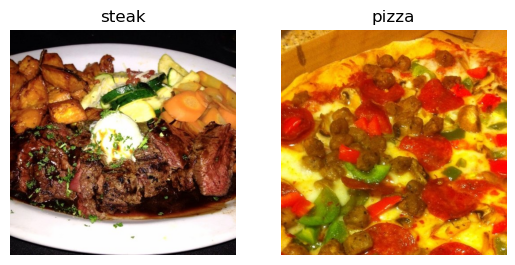

In [63]:
plt.figure()
plt.subplot(1, 2, 1)
steak_img = view_random_image("/kaggle/working/pizza_steak/train/", "steak")
plt.subplot(1, 2, 2)
pizza_img = view_random_image("/kaggle/working/pizza_steak/train/", "pizza")
plt.show()

### 2. Preprocess the Data

In [72]:
# Defining Train and Test Directory
train_dir = "/kaggle/working/pizza_steak/train/"
test_dir = "/kaggle/working/pizza_steak/test"

In [73]:
# Preparing to convert images of 750 in batches and trainsforming images (i.e. rescaling them)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

In [74]:
# Extracting data from there respective direcorites in ImageDataGenerator using flow_from_directory method
train_data = train_datagen.flow_from_directory(directory=train_dir,
                                               target_size=(224,224),
                                               class_mode="binary",
                                               batch_size=32)
test_data = test_datagen.flow_from_directory(directory=test_dir,
                                             target_size=(224,224),
                                             class_mode="binary",
                                             batch_size=32)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [76]:
images, labels = train_data.next()
len(images), len(labels)

(32, 32)

In [77]:
images[:2], images[0].shape

(array([[[[0.09803922, 0.1254902 , 0.20000002],
          [0.0627451 , 0.08627451, 0.14901961],
          [0.05882353, 0.06666667, 0.11764707],
          ...,
          [0.08627451, 0.10980393, 0.24313727],
          [0.09019608, 0.1137255 , 0.24705884],
          [0.08235294, 0.10588236, 0.2392157 ]],
 
         [[0.09803922, 0.1254902 , 0.20000002],
          [0.09411766, 0.1137255 , 0.18823531],
          [0.07450981, 0.08235294, 0.14117648],
          ...,
          [0.07843138, 0.10196079, 0.23529413],
          [0.08235294, 0.10588236, 0.2392157 ],
          [0.09019608, 0.1137255 , 0.24705884]],
 
         [[0.07843138, 0.10588236, 0.18039216],
          [0.09411766, 0.1137255 , 0.18823531],
          [0.08627451, 0.09803922, 0.16470589],
          ...,
          [0.08235294, 0.10588236, 0.23137257],
          [0.08235294, 0.10588236, 0.23137257],
          [0.07843138, 0.10196079, 0.227451  ]],
 
         ...,
 
         [[0.13725491, 0.1254902 , 0.16862746],
          [0.12549

In [79]:
labels

array([0., 1., 1., 1., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1., 0., 0., 0.],
      dtype=float32)

### 3. Creating Model (starting with baseline)

In [82]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential as seq

In [90]:
model_4 = seq([
    Conv2D(filters=10,kernel_size=3,strides=1,padding="valid",
           activation="relu",input_shape=(224,224,3)),
    Conv2D(10, 3, activation="relu"),
    Conv2D(10, 3, activation="relu"),
    Flatten(),
    Dense(1, activation="sigmoid")
])

In [91]:
model_4.compile(loss="binary_crossentropy",optimizer=Adam(),
                metrics=["accuracy"])

In [92]:
history_4 = model_4.fit(train_data,epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 82s 2s/step - loss: 0.6868 - accuracy: 0.6087 - val_loss: 0.5964 - val_accuracy: 0.6600
Epoch 2/5
47/47 [==============================] - 80s 2s/step - loss: 0.4426 - accuracy: 0.8093 - val_loss: 0.4904 - val_accuracy: 0.7700
Epoch 3/5
47/47 [==============================] - 85s 2s/step - loss: 0.2959 - accuracy: 0.8860 - val_loss: 0.3854 - val_accuracy: 0.8220
Epoch 4/5
47/47 [==============================] - 80s 2s/step - loss: 0.1311 - accuracy: 0.9647 - val_loss: 0.4689 - val_accuracy: 0.7960
Epoch 5/5
47/47 [==============================] - 80s 2s/step - loss: 0.0435 - accuracy: 0.9953 - val_loss: 0.5152 - val_accuracy: 0.7900


## Evaluating the Model

<Axes: >

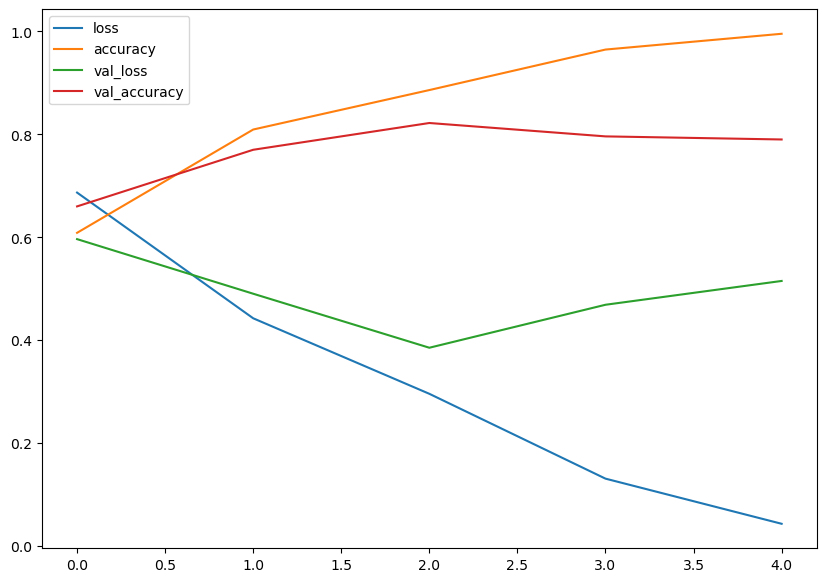

In [93]:
import pandas as pd
pd.DataFrame(history_4.history).plot(figsize=(10,7))

In [88]:
def plot_loss_curves(history):
    """
    Return separate loss curves for training and validation metrics
    """
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    
    accuracy = history.history["accuracy"]
    val_accuracy = history.history["val_accuracy"]
    
    epochs = range(len(history.history['loss']))
    
    plt.plot(epochs, loss, label='training_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    
    plt.figure()
    plt.plot(epochs, accuracy, label='training_accuracy')
    plt.plot(epochs, val_accuracy, label='val_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend();

In [ ]:
plot_loss_curves(history_4)

In [ ]:
model_4.summary()

## Adjust Model Parameters

In [101]:
model_5 = seq([
    Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation='sigmoid')
])

In [102]:
model_5.compile(loss='binary_crossentropy',optimizer=Adam(),
                metrics=['accuracy'])

In [103]:
history_5 = model_5.fit(train_data,epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 33s 662ms/step - loss: 0.6033 - accuracy: 0.6633 - val_loss: 0.4746 - val_accuracy: 0.7560
Epoch 2/5
47/47 [==============================] - 31s 659ms/step - loss: 0.4705 - accuracy: 0.7900 - val_loss: 0.3916 - val_accuracy: 0.8200
Epoch 3/5
47/47 [==============================] - 31s 657ms/step - loss: 0.4090 - accuracy: 0.8173 - val_loss: 0.3496 - val_accuracy: 0.8400
Epoch 4/5
47/47 [==============================] - 31s 657ms/step - loss: 0.3798 - accuracy: 0.8340 - val_loss: 0.3298 - val_accuracy: 0.8600
Epoch 5/5
47/47 [==============================] - 31s 656ms/step - loss: 0.3668 - accuracy: 0.8373 - val_loss: 0.3262 - val_accuracy: 0.8560


In [104]:
model_5.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_19 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 111, 111, 10)     0         
 2D)                                                             
                                                                 
 conv2d_20 (Conv2D)          (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 54, 54, 10)       0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 52, 52, 10)        910       
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 26, 26, 10)      

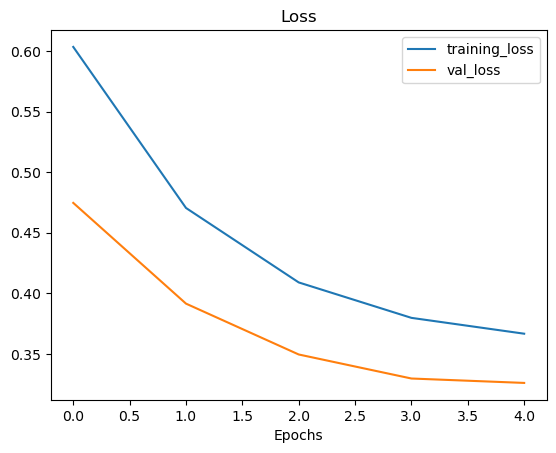

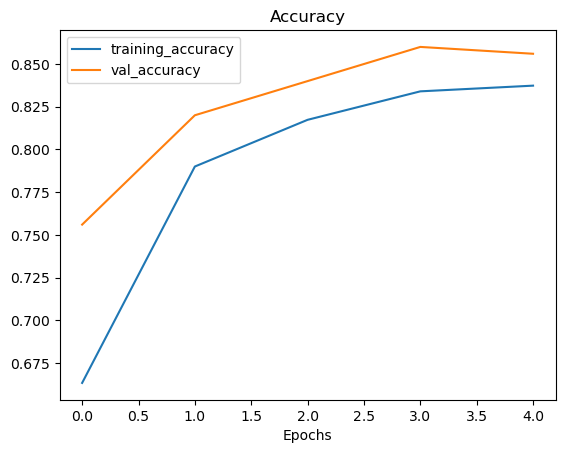

In [105]:
plot_loss_curves(history_5)

In [109]:
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
                                            rotation_range=20,
                                            shear_range=0.2,
                                            zoom_range=0.2,
                                            width_shift_range=0.2,
                                            height_shift_range=0.2,
                                            horizontal_flip=True)

train_datagen = ImageDataGenerator(rescale=1/255.)

test_datagen = ImageDataGenerator(rescale=1/255.)

In [112]:
print('Augmented training images:')
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224, 224),
                                                                   batch_size=32,
                                                                   class_mode='binary',
                                                                   shuffle=False)

print("Non-Augmented training images:")
train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224,224),
                                               batch_size=32,
                                               class_mode='binary',
                                               shuffle=False)

print("Non-Augmented testing images:")
test_data = test_datagen.flow_from_directory(test_dir,
                                               target_size=(224,224),
                                               batch_size=32,
                                               class_mode='binary',
                                               shuffle=False)

Augmented training images:
Found 1500 images belonging to 2 classes.
Non-Augmented training images:
Found 1500 images belonging to 2 classes.
Non-Augmented testing images:
Found 500 images belonging to 2 classes.


In [113]:
images, labels = train_data.next()
augmented_images, augmented_labels = train_data_augmented.next()

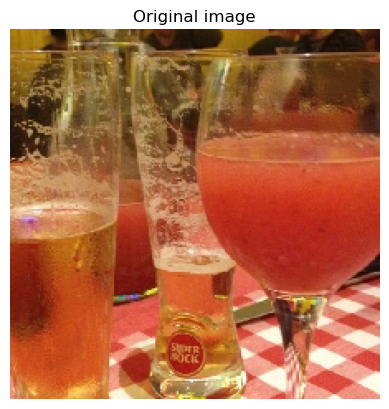

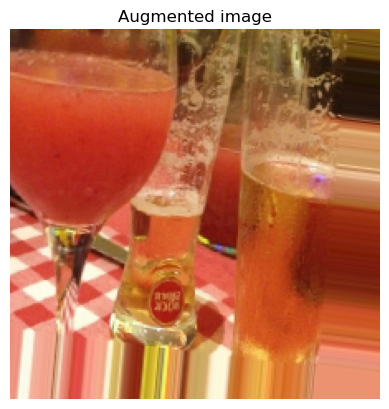

In [121]:
random_number = random.randint(0,31)
plt.imshow(images[random_number])
plt.title(f'Original image')
plt.axis(False)
plt.figure()
plt.imshow(augmented_images[random_number])
plt.title(f'Augmented image')
plt.axis(False);

In [124]:
# Create the model (same as model_5)
model_6 = seq([
  Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
  MaxPool2D(pool_size=2), # reduce number of features by half
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(1, activation='sigmoid')
])

# Compile the model
model_6.compile(loss='binary_crossentropy',
                optimizer=Adam(),
                metrics=['accuracy'])

# Fit the model
history_6 = model_6.fit(train_data_augmented, # changed to augmented training data
                        epochs=5,
                        steps_per_epoch=len(train_data_augmented),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 41s 840ms/step - loss: 0.7082 - accuracy: 0.4927 - val_loss: 0.6797 - val_accuracy: 0.6000
Epoch 2/5
47/47 [==============================] - 39s 828ms/step - loss: 0.6846 - accuracy: 0.5927 - val_loss: 0.6386 - val_accuracy: 0.5680
Epoch 3/5
47/47 [==============================] - 39s 828ms/step - loss: 0.6615 - accuracy: 0.6293 - val_loss: 0.5382 - val_accuracy: 0.8320
Epoch 4/5
47/47 [==============================] - 39s 831ms/step - loss: 0.6223 - accuracy: 0.6780 - val_loss: 0.5434 - val_accuracy: 0.6800
Epoch 5/5
47/47 [==============================] - 39s 827ms/step - loss: 0.5899 - accuracy: 0.6867 - val_loss: 0.5013 - val_accuracy: 0.7560


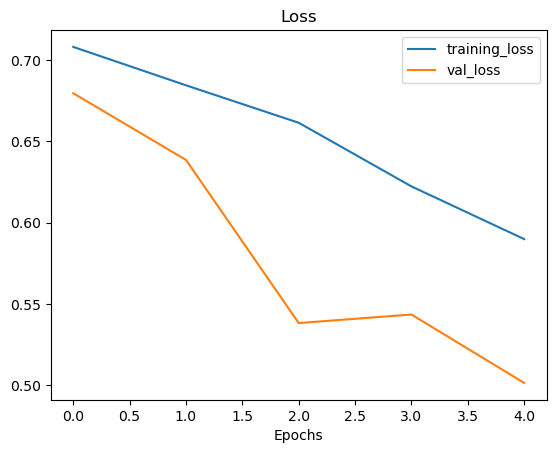

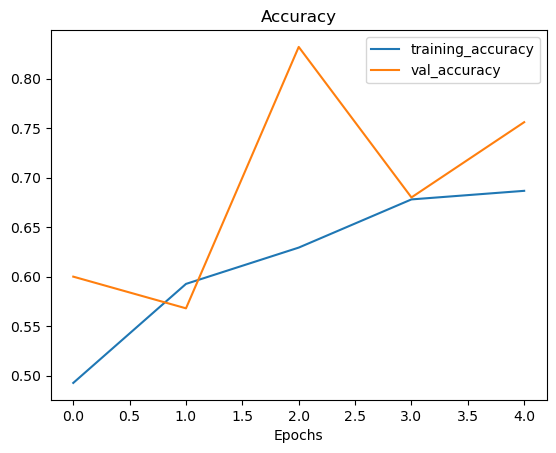

In [125]:
plot_loss_curves(history_6)

In [126]:
# Import data and augment it from directories
train_data_augmented_shuffled = train_datagen_augmented.flow_from_directory(train_dir,
                                                                            target_size=(224, 224),
                                                                            batch_size=32,
                                                                            class_mode='binary',
                                                                            shuffle=True) # Shuffle data (default)

Found 1500 images belonging to 2 classes.


In [128]:
# Create the model (same as model_5 and model_6)
model_7 = seq([
  Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(1, activation='sigmoid')
])

# Compile the model
model_7.compile(loss='binary_crossentropy',
                optimizer=Adam(),
                metrics=['accuracy'])

# Fit the model
history_7 = model_7.fit(train_data_augmented_shuffled, # now the augmented data is shuffled
                        epochs=5,
                        steps_per_epoch=len(train_data_augmented_shuffled),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 41s 841ms/step - loss: 0.6933 - accuracy: 0.5620 - val_loss: 0.6155 - val_accuracy: 0.7880
Epoch 2/5
47/47 [==============================] - 40s 841ms/step - loss: 0.5663 - accuracy: 0.7380 - val_loss: 0.4244 - val_accuracy: 0.8140
Epoch 3/5
47/47 [==============================] - 39s 823ms/step - loss: 0.5247 - accuracy: 0.7500 - val_loss: 0.4068 - val_accuracy: 0.8340
Epoch 4/5
47/47 [==============================] - 39s 818ms/step - loss: 0.5080 - accuracy: 0.7700 - val_loss: 0.4000 - val_accuracy: 0.8440
Epoch 5/5
47/47 [==============================] - 39s 822ms/step - loss: 0.5306 - accuracy: 0.7527 - val_loss: 0.4214 - val_accuracy: 0.8540


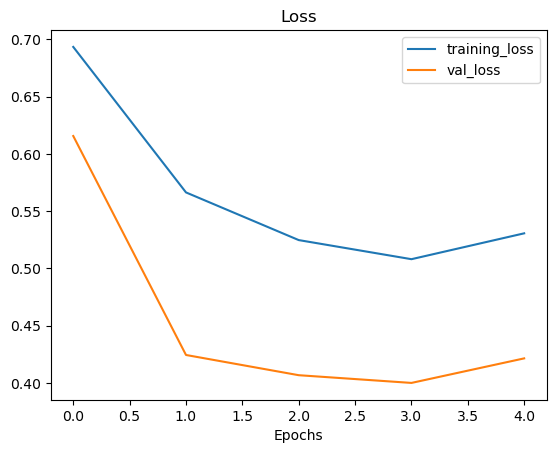

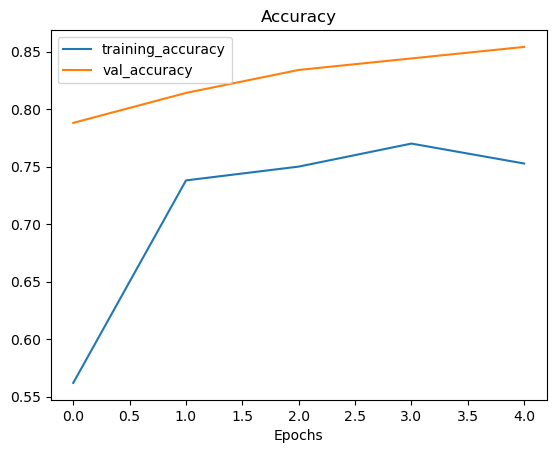

In [129]:
plot_loss_curves(history_7)

In [131]:
# Create a CNN model (same as Tiny VGG but for binary classification - https://poloclub.github.io/cnn-explainer/ )
model_8 = seq([
  Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)), # same input shape as our images
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(1, activation='sigmoid')
])

# Compile the model
model_8.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit the model
history_8 = model_8.fit(train_data_augmented_shuffled,
                        epochs=5,
                        steps_per_epoch=len(train_data_augmented_shuffled),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 75s 2s/step - loss: 0.6587 - accuracy: 0.5800 - val_loss: 0.5136 - val_accuracy: 0.7320
Epoch 2/5
47/47 [==============================] - 73s 2s/step - loss: 0.5552 - accuracy: 0.7107 - val_loss: 0.4482 - val_accuracy: 0.7860
Epoch 3/5
47/47 [==============================] - 72s 2s/step - loss: 0.5172 - accuracy: 0.7500 - val_loss: 0.4228 - val_accuracy: 0.8060
Epoch 4/5
47/47 [==============================] - 72s 2s/step - loss: 0.5095 - accuracy: 0.7607 - val_loss: 0.4388 - val_accuracy: 0.8160
Epoch 5/5
47/47 [==============================] - 73s 2s/step - loss: 0.4487 - accuracy: 0.8000 - val_loss: 0.3159 - val_accuracy: 0.8680


In [132]:
model_1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 110, 110, 10)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_7 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                  

In [133]:
model_8.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 conv2d_29 (Conv2D)          (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 110, 110, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 108, 108, 10)      910       
                                                                 
 conv2d_31 (Conv2D)          (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 53, 53, 10)       0         
 g2D)                                                

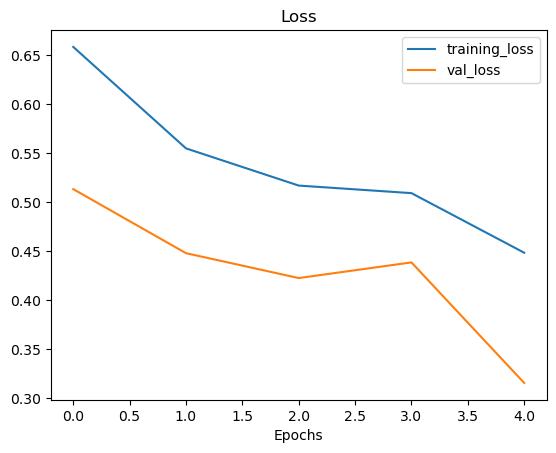

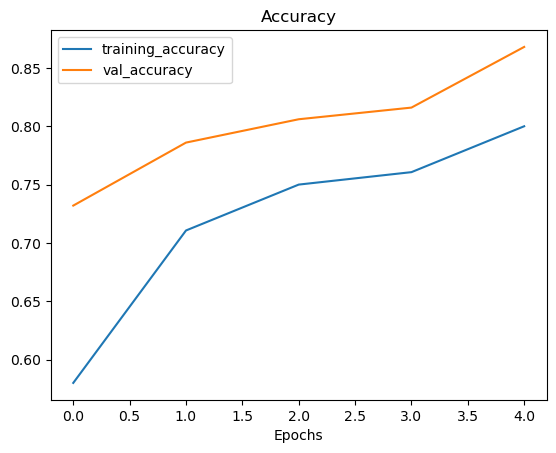

In [134]:
plot_loss_curves(history_8)

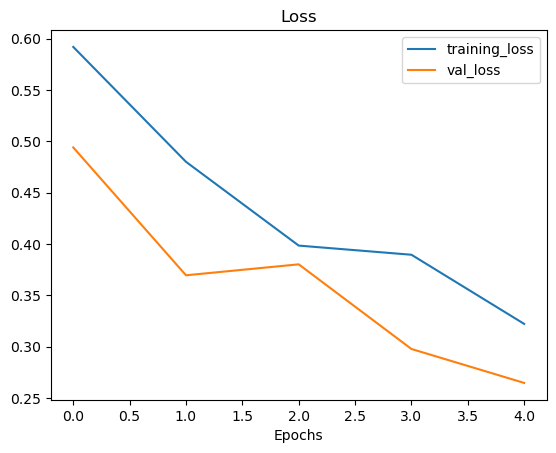

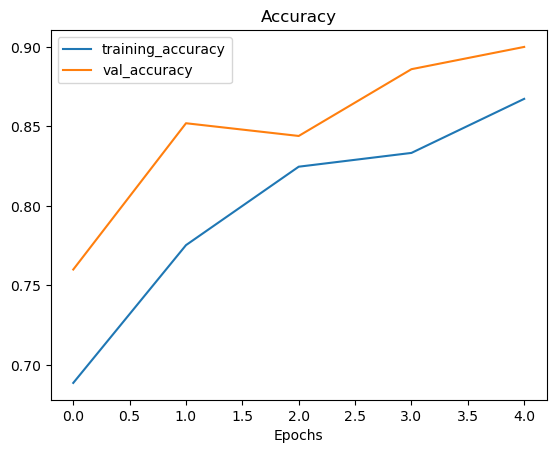

In [135]:
plot_loss_curves(history_1)

--2023-06-03 08:44:05--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1978213 (1.9M) [image/jpeg]
Saving to: ‘03-steak.jpeg’

03-steak.jpeg       100%[===================>]   1.89M  --.-KB/s    in 0.07s   

2023-06-03 08:44:06 (26.2 MB/s) - ‘03-steak.jpeg’ saved [1978213/1978213]



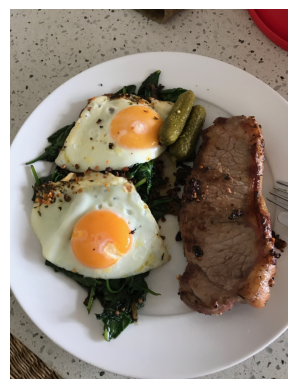

In [136]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg 
steak = mpimg.imread("/kaggle/working/03-steak.jpeg")
plt.imshow(steak)
plt.axis(False);

In [137]:
steak.shape

(4032, 3024, 3)

In [138]:
def load_and_prep_image(filename, img_shape=224):
    img = tf.io.read_file(filename)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, size=[img_shape, img_shape])
    img = img/255.
    return img

In [139]:
steak = load_and_prep_image("/kaggle/working/03-steak.jpeg")
steak

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.6377451 , 0.6220588 , 0.57892156],
        [0.6504902 , 0.63186276, 0.5897059 ],
        [0.63186276, 0.60833335, 0.5612745 ],
        ...,
        [0.52156866, 0.05098039, 0.09019608],
        [0.49509802, 0.04215686, 0.07058824],
        [0.52843136, 0.07745098, 0.10490196]],

       [[0.6617647 , 0.6460784 , 0.6107843 ],
        [0.6387255 , 0.6230392 , 0.57598037],
        [0.65588236, 0.63235295, 0.5852941 ],
        ...,
        [0.5352941 , 0.06862745, 0.09215686],
        [0.529902  , 0.05931373, 0.09460784],
        [0.5142157 , 0.05539216, 0.08676471]],

       [[0.6519608 , 0.6362745 , 0.5892157 ],
        [0.6392157 , 0.6137255 , 0.56764704],
        [0.65637255, 0.6269608 , 0.5828431 ],
        ...,
        [0.53137255, 0.06470589, 0.08039216],
        [0.527451  , 0.06862745, 0.1       ],
        [0.52254903, 0.05196078, 0.0872549 ]],

       ...,

       [[0.49313724, 0.42745098, 0.31029412],
        [0.05

In [140]:
model_8.predict(steak)

ValueError: in user code:

    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 2169, in predict_function  *
        return step_function(self, iterator)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 2155, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 2143, in run_step  **
        outputs = model.predict_step(data)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 2111, in predict_step
        return self(x, training=False)
    File "/opt/conda/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential_10" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(32, 224, 3)


In [141]:
print(f"Shape before new dimension: {steak.shape}")
steak = tf.expand_dims(steak, axis=0)
print(f"Shape after new dimension: {steak.shape}")

Shape before new dimension: (224, 224, 3)
Shape after new dimension: (1, 224, 224, 3)


In [142]:
pred = model_8.predict(steak)
pred

1/1 [==============================] - 0s 115ms/step


array([[0.7114679]], dtype=float32)

In [145]:
class_names

array(['pizza', 'steak'], dtype='<U5')

In [147]:
pred_class = class_names[int(tf.round(pred)[0][0])]
pred_class

'steak'

In [153]:
def pred_and_plot(model, filename, class_name):
    img = load_and_prep_image(filename)
    pred=model.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[int(tf.round(pred)[0][0])]
    plt.imshow(img)
    plt.title(f"Prediction: {pred_class}")
    plt.axis(False)

1/1 [==============================] - 0s 37ms/step


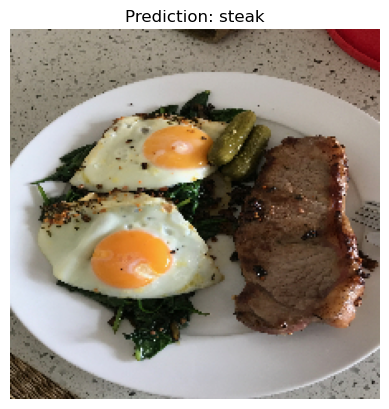

In [154]:
pred_and_plot(model_8, "/kaggle/working/03-steak.jpeg", class_names)

--2023-06-03 08:55:53--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2874848 (2.7M) [image/jpeg]
Saving to: ‘03-pizza-dad.jpeg’

03-pizza-dad.jpeg   100%[===================>]   2.74M  --.-KB/s    in 0.08s   

2023-06-03 08:55:54 (35.0 MB/s) - ‘03-pizza-dad.jpeg’ saved [2874848/2874848]

1/1 [==============================] - 0s 35ms/step


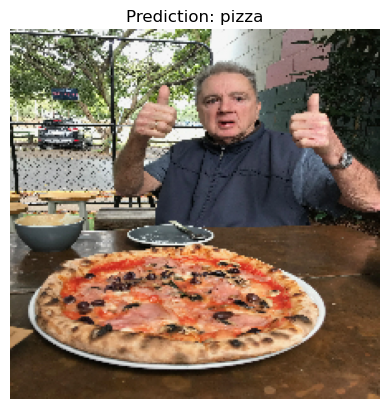

In [155]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg 
pred_and_plot(model_8, "/kaggle/working/03-pizza-dad.jpeg", class_names)

## Multi-Class Classification

### 1. Importing Data

In [156]:
import os

for dirpath, dirnames, filenames in os.walk("/kaggle/working/10_food_classes/"):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'")

There are 2 directories and 0 images in '/kaggle/working/10_food_classes/'
There are 10 directories and 0 images in '/kaggle/working/10_food_classes/test'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/ramen'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/ice_cream'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/sushi'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/chicken_curry'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/pizza'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/steak'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/grilled_salmon'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/hamburger'
There are 0 directories and 250 images in '/kaggle/working/10_food_classes/test/fried_rice'
There are 0 directories and 250 

In [162]:
train_dir = "/kaggle/working/10_food_classes/train/"
test_dir = "/kaggle/working/10_food_classes/test/"

In [163]:
import pathlib
import numpy as np
data_dir = pathlib.Path(train_dir)
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


image shape: (512, 384, 3)


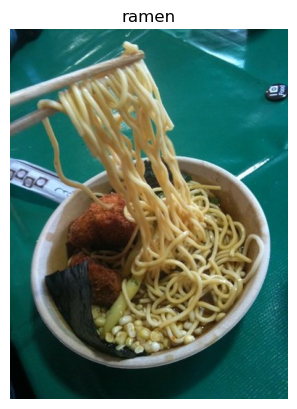

In [195]:
import random
img = view_random_image(target_dir=train_dir,
                        target_class=random.choice(class_names))

### 2. Preprocessing Data

In [198]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Rescale the data and create data generator instances
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

# Load data in from directories and turn it into batches
train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224, 224),
                                               batch_size=32,
                                               class_mode='categorical') # changed to categorical

test_data = train_datagen.flow_from_directory(test_dir,
                                              target_size=(224, 224),
                                              batch_size=32,
                                              class_mode='categorical')

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


## Creating Model

In [199]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense

# Create our model (a clone of model_8, except to be multi-class)
model_9 = Sequential([
  Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(10, activation='softmax') # changed to have 10 neurons (same as number of classes) and 'softmax' activation
])

# Compile the model
model_9.compile(loss="categorical_crossentropy", # changed to categorical_crossentropy
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

### 4. Fitting Model

In [202]:
histry_9 = model_9.fit(train_data,
                       epochs=5,
                       steps_per_epoch=len(train_data),
                       validation_data=test_data,
                       validation_steps=len(test_data))

Epoch 1/5
235/235 [==============================] - 332s 1s/step - loss: 1.5210 - accuracy: 0.4783 - val_loss: 2.1532 - val_accuracy: 0.2984
Epoch 2/5
235/235 [==============================] - 332s 1s/step - loss: 0.9239 - accuracy: 0.7003 - val_loss: 2.4652 - val_accuracy: 0.2912
Epoch 3/5
235/235 [==============================] - 332s 1s/step - loss: 0.3615 - accuracy: 0.8921 - val_loss: 3.8798 - val_accuracy: 0.2812
Epoch 4/5
235/235 [==============================] - 332s 1s/step - loss: 0.1096 - accuracy: 0.9669 - val_loss: 5.4138 - val_accuracy: 0.2556
Epoch 5/5
235/235 [==============================] - 332s 1s/step - loss: 0.0650 - accuracy: 0.9809 - val_loss: 5.9463 - val_accuracy: 0.2660


### 5. Evaluating the Model

In [203]:
model_9.evaluate(test_data)

79/79 [==============================] - 30s 375ms/step - loss: 5.9463 - accuracy: 0.2660


[5.946296215057373, 0.26600000262260437]

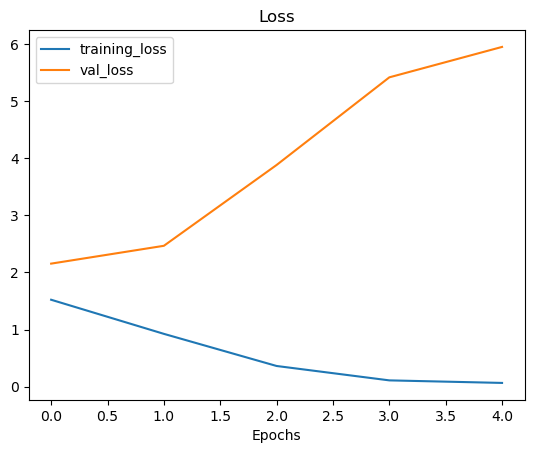

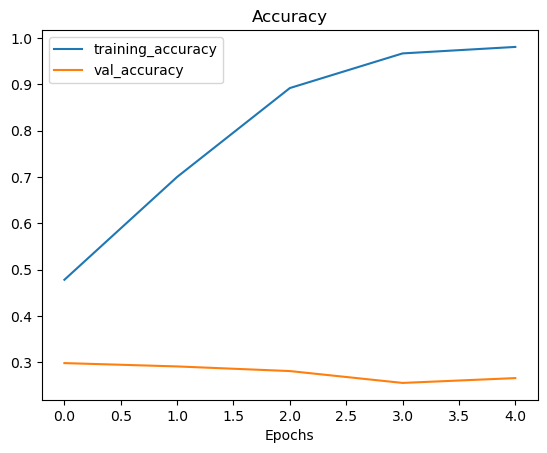

In [205]:
plot_loss_curves(histry_9)

### 6. Adjusting Parameters

In [206]:
# Try a simplified model (removed two layers)
model_10 = Sequential([
  Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
  MaxPool2D(),
  Conv2D(10, 3, activation='relu'),
  MaxPool2D(),
  Flatten(),
  Dense(10, activation='softmax')
])

model_10.compile(loss='categorical_crossentropy',
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=['accuracy'])

history_10 = model_10.fit(train_data,
                          epochs=5,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5
235/235 [==============================] - 145s 614ms/step - loss: 2.3014 - accuracy: 0.1436 - val_loss: 2.2493 - val_accuracy: 0.1796
Epoch 2/5
235/235 [==============================] - 145s 616ms/step - loss: 2.0092 - accuracy: 0.2945 - val_loss: 2.1470 - val_accuracy: 0.2416
Epoch 3/5
235/235 [==============================] - 144s 613ms/step - loss: 1.5862 - accuracy: 0.4664 - val_loss: 2.1767 - val_accuracy: 0.2540
Epoch 4/5
235/235 [==============================] - 142s 608ms/step - loss: 1.1085 - accuracy: 0.6429 - val_loss: 2.4480 - val_accuracy: 0.2604
Epoch 5/5
235/235 [==============================] - 145s 619ms/step - loss: 0.6386 - accuracy: 0.8112 - val_loss: 2.9984 - val_accuracy: 0.2380


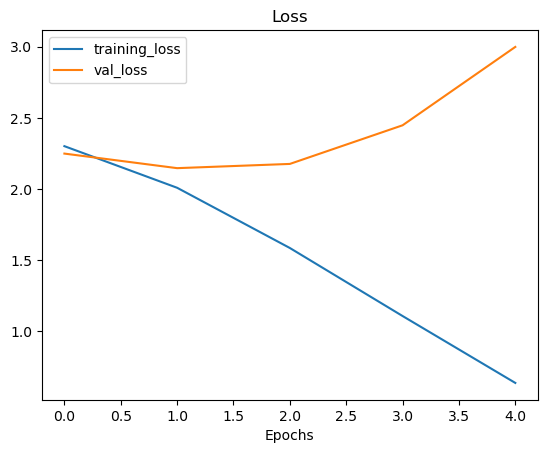

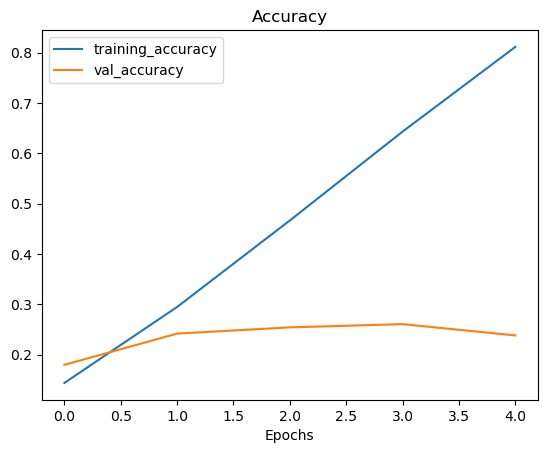

In [207]:
plot_loss_curves(history_10)

* Data augmentation

In [208]:
# Create augmented data generator instance
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
                                             rotation_range=20, # note: this is an int not a float
                                             width_shift_range=0.2,
                                             height_shift_range=0.2,
                                             zoom_range=0.2,
                                             horizontal_flip=True)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                  target_size=(224, 224),
                                                                  batch_size=32,
                                                                  class_mode='categorical')

Found 7500 images belonging to 10 classes.


In [209]:
# Clone the model (use the same architecture)
model_11 = tf.keras.models.clone_model(model_10)

# Compile the cloned model (same setup as used for model_10)
model_11.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

# Fit the model
history_11 = model_11.fit(train_data_augmented, # use augmented data
                          epochs=5,
                          steps_per_epoch=len(train_data_augmented),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5
235/235 [==============================] - 190s 803ms/step - loss: 2.1962 - accuracy: 0.1952 - val_loss: 1.9907 - val_accuracy: 0.2856
Epoch 2/5
235/235 [==============================] - 188s 800ms/step - loss: 2.0637 - accuracy: 0.2644 - val_loss: 1.8988 - val_accuracy: 0.3480
Epoch 3/5
235/235 [==============================] - 187s 795ms/step - loss: 1.9876 - accuracy: 0.2983 - val_loss: 1.7984 - val_accuracy: 0.3920
Epoch 4/5
235/235 [==============================] - 190s 805ms/step - loss: 1.9381 - accuracy: 0.3249 - val_loss: 1.7653 - val_accuracy: 0.4108
Epoch 5/5
235/235 [==============================] - 187s 793ms/step - loss: 1.9233 - accuracy: 0.3392 - val_loss: 1.8513 - val_accuracy: 0.3644


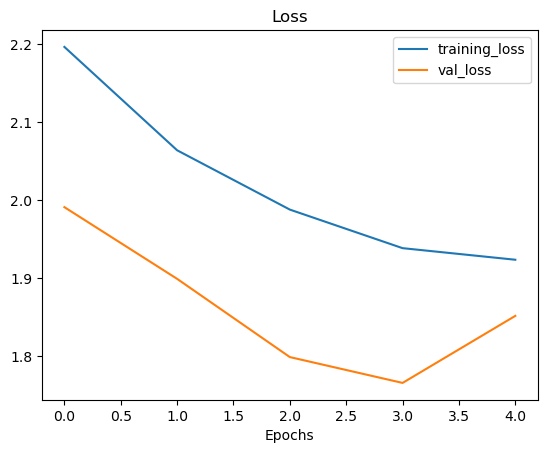

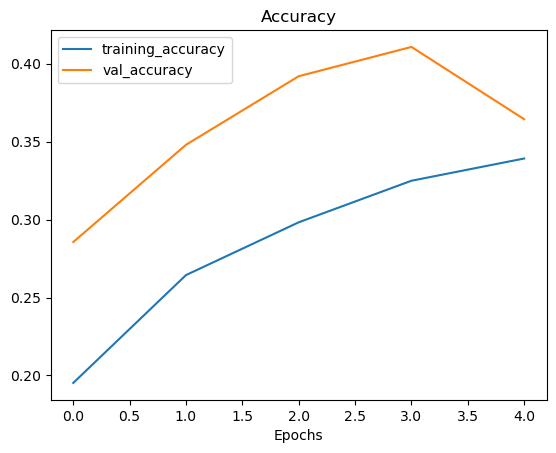

In [210]:
# Check out our model's performance with augmented data
plot_loss_curves(history_11)

## Making predictions with trained model

In [211]:
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

In [212]:
# -q is for "quiet"
!wget -q https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
!wget -q https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
!wget -q https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-hamburger.jpeg
!wget -q https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-sushi.jpeg

1/1 [==============================] - 0s 93ms/step


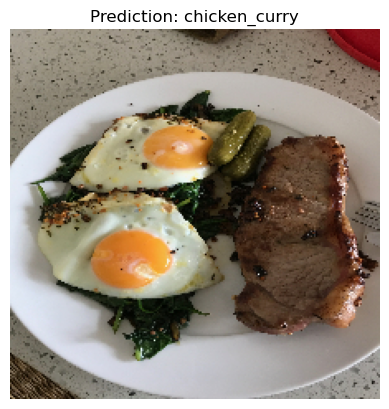

In [214]:
# Make a prediction using model_11
pred_and_plot(model=model_11, 
              filename="03-steak.jpeg", 
              class_name=class_names)

1/1 [==============================] - 0s 32ms/step


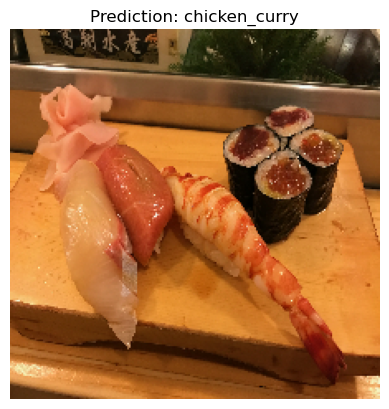

In [215]:
pred_and_plot(model_11, "03-sushi.jpeg", class_names)

1/1 [==============================] - 0s 32ms/step


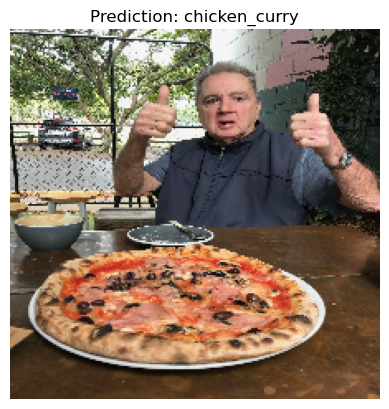

In [216]:
pred_and_plot(model_11, "03-pizza-dad.jpeg", class_names)

1/1 [==============================] - 0s 29ms/step


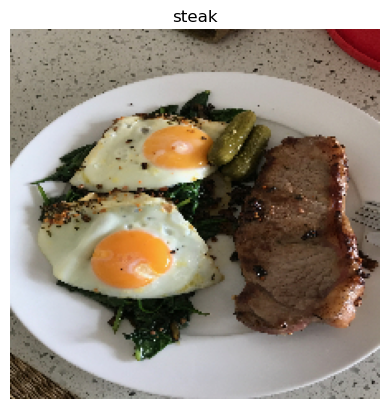

In [217]:
# Load in and preprocess our custom image
img = load_and_prep_image("/kaggle/working/03-steak.jpeg")

# Make a prediction
pred = model_11.predict(tf.expand_dims(img, axis=0))

# Match the prediction class to the highest prediction probability
pred_class = class_names[pred.argmax()]
plt.imshow(img)
plt.title(pred_class)
plt.axis(False);

In [218]:
# Check the output of the predict function
pred = model_11.predict(tf.expand_dims(img, axis=0))
pred

1/1 [==============================] - 0s 33ms/step


array([[0.05598814, 0.06342617, 0.04377014, 0.12394984, 0.18370901,
        0.04501789, 0.0427743 , 0.10660996, 0.25311226, 0.08164234]],
      dtype=float32)

In [219]:
# Find the predicted class name
class_names[pred.argmax()]

'steak'

In [221]:
# Adjust function to work with multi-class
def pred_and_plot(model, filename, class_names):
    """
    Imports an image located at filename, makes a prediction on it with
    a trained model and plots the image with the predicted class as the title.
    """
    # Import the target image and preprocess it
    img = load_and_prep_image(filename)

    # Make a prediction
    pred = model.predict(tf.expand_dims(img, axis=0))

    # Get the predicted class
    if len(pred[0]) > 1: # check for multi-class
        pred_class = class_names[pred.argmax()] # if more than one output, take the max
    else:
        pred_class = class_names[int(tf.round(pred)[0][0])] # if only one output, round

    # Plot the image and predicted class
    plt.imshow(img)
    plt.title(f"Prediction: {pred_class}")
    plt.axis(False);

1/1 [==============================] - 0s 31ms/step


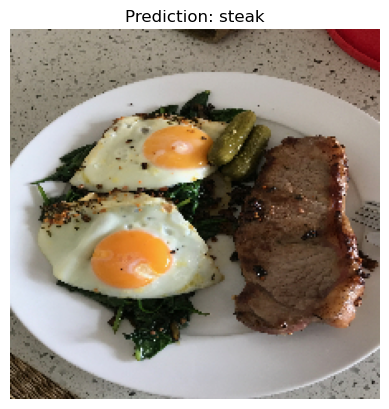

In [222]:
pred_and_plot(model_11, "03-steak.jpeg", class_names)

1/1 [==============================] - 0s 28ms/step


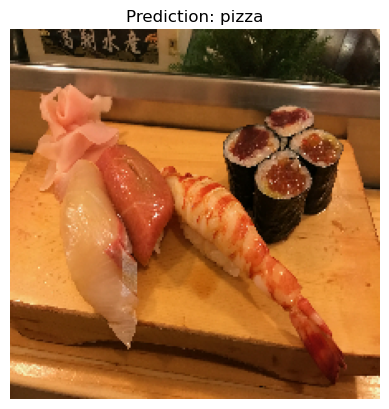

In [223]:
pred_and_plot(model_11, "03-sushi.jpeg", class_names)

1/1 [==============================] - 0s 30ms/step


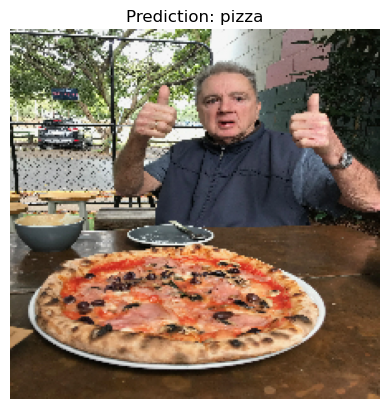

In [224]:
pred_and_plot(model_11, "03-pizza-dad.jpeg", class_names)

1/1 [==============================] - 0s 30ms/step


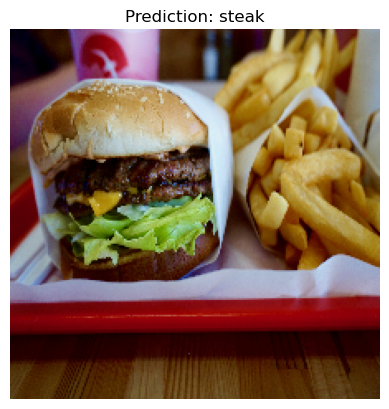

In [225]:
pred_and_plot(model_11, "03-hamburger.jpeg", class_names)

In [226]:
model_11.save("saved_trained_model")

In [227]:
# Load in a model and evaluate it
loaded_model_11 = tf.keras.models.load_model("saved_trained_model")
loaded_model_11.evaluate(test_data)

79/79 [==============================] - 16s 203ms/step - loss: 1.8513 - accuracy: 0.3644


[1.85128653049469, 0.3643999993801117]

In [228]:
model_11.evaluate(test_data)

79/79 [==============================] - 16s 206ms/step - loss: 1.8513 - accuracy: 0.3644


[1.8512868881225586, 0.3643999993801117]

In [229]:
model_11.save("saved_trained_model.h5")

In [230]:
loaded_model_11 = tf.keras.models.load_model("saved_trained_model.h5")
loaded_model_11.evaluate(test_data)

79/79 [==============================] - 16s 202ms/step - loss: 1.8513 - accuracy: 0.3644


[1.8512861728668213, 0.3643999993801117]